# Problem 1

### Getting familiar with loading, visualizing and operating on multivariate data

A Hess diagram is a 2D plot coded by a third quantity.

Here's an example from the [astroML documentation](https://www.astroml.org/examples/datasets/plot_SDSS_SSPP.html) showing the temperature and surface gravity (how strongly the star would pull on you if you could stand on it's surface, including the effect of rotation), color coded on the left by density, and on the right by metallicity (measured here as the ratio of iron to hydrogen) with density contours.


<img src="https://www.astroml.org/_images/plot_SDSS_SSPP_1.png">

#### From http://das.sdss.org/va/stripe_82_variability/SDSS_82_public/, download eight HLC\*fits.gz files (and recall how you can use `astropy.io.fits` to load these)

#### The HLC files are each different bands on the sky.

#### For each HLC file, separate stars and galaxies by using the `MEAN_OBJECT_TYPE` column and making a cut with value > 5 to find stars.

In [351]:
import numpy as np
import matplotlib.pyplot as plt
import astropy.io
from astropy.io import fits
import seaborn as sns
import pandas as pd
import statsmodels.api as sm 
import scipy.stats as st
%matplotlib inline

In [319]:
list_HLC = ("/Users/linaflorez/Downloads/HLC.RA_00_to_01.fits.gz",\
            "/Users/linaflorez/Downloads/HLC.RA_01_to_02.fits.gz",\
            "/Users/linaflorez/Downloads/HLC.RA_02_to_03.fits.gz",\
            "/Users/linaflorez/Downloads/HLC.RA_03_to_04.fits.gz",\
            "/Users/linaflorez/Downloads/HLC.RA_20_to_21.fits.gz",\
            "/Users/linaflorez/Downloads/HLC.RA_21_to_22.fits.gz",\
            "/Users/linaflorez/Downloads/HLC.RA_22_to_23.fits.gz",\
            "/Users/linaflorez/Downloads/HLC.RA_23_to_24.fits.gz")

#### For each HLC file, and separately for stars and galaxies make a 3-panel plot.

#### In the left plot show `r` vs `g-i` color coded by density (recall we did this with `seaborn`'s `jointplot`, but you can use whatever). Estimate a bivariate distribution for `density(r, g-i)` this sample (recall we did with `seaborn`'s `jointplot` use `kde`, but you can use whatever).

#### In the middle and right panel, again plot `r` vs `g-i`, but now color-coded by proper motion in RA, and Dec. Overlay the density contors.

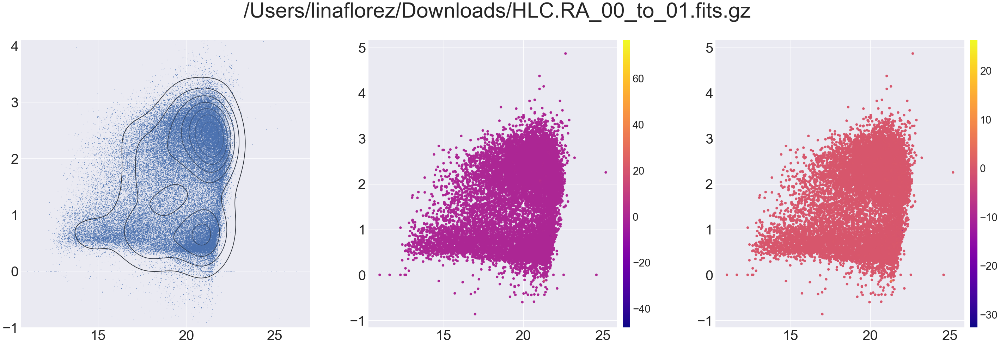

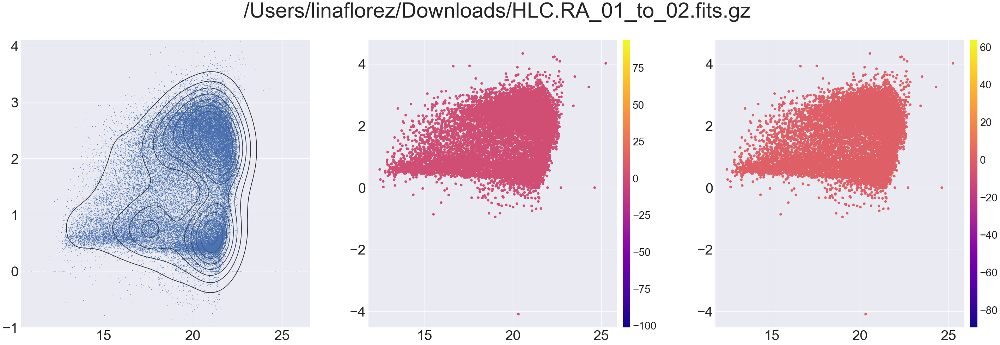

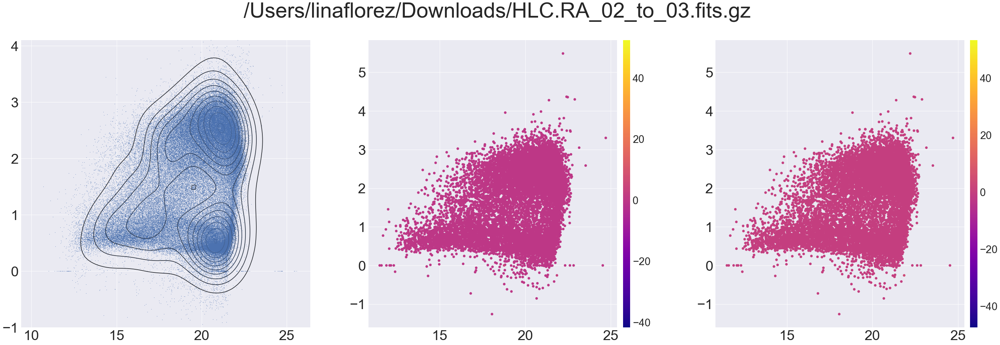

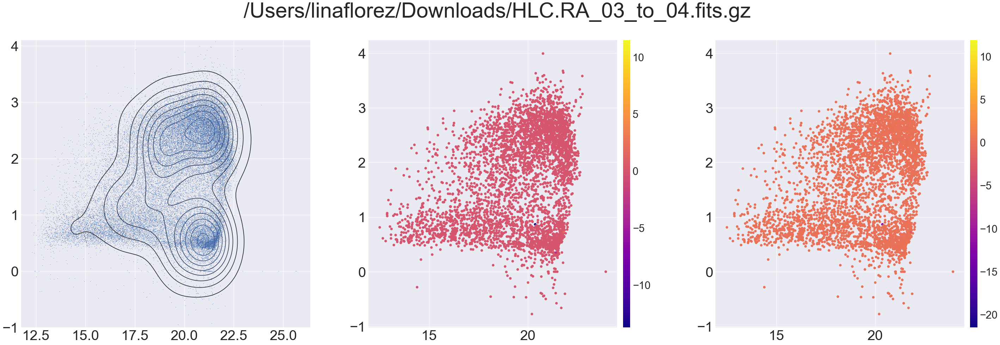

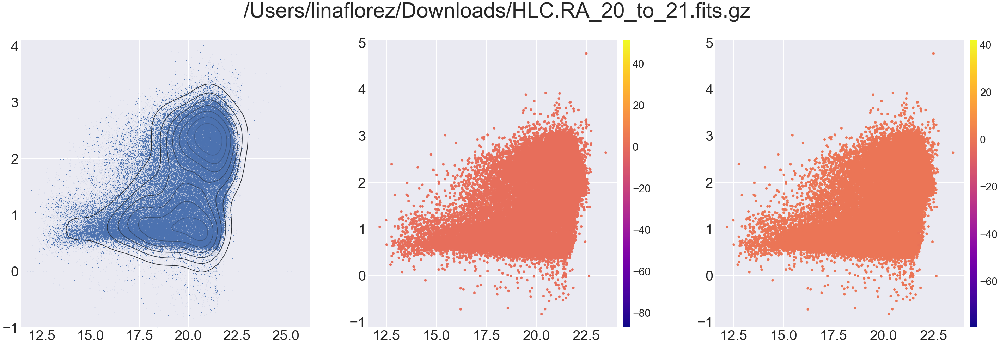

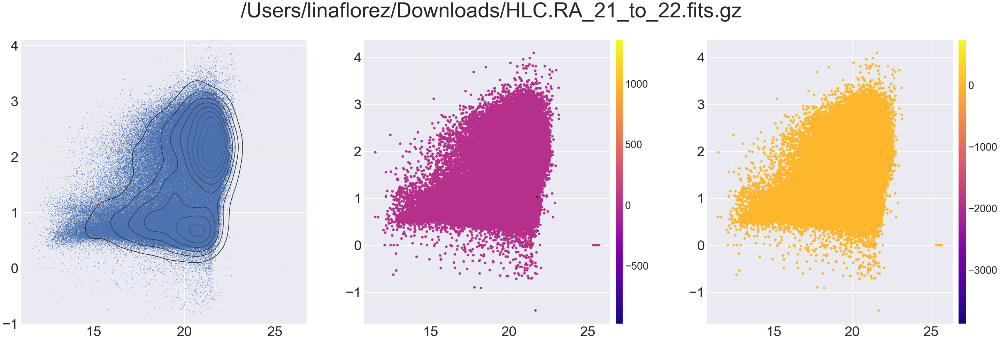

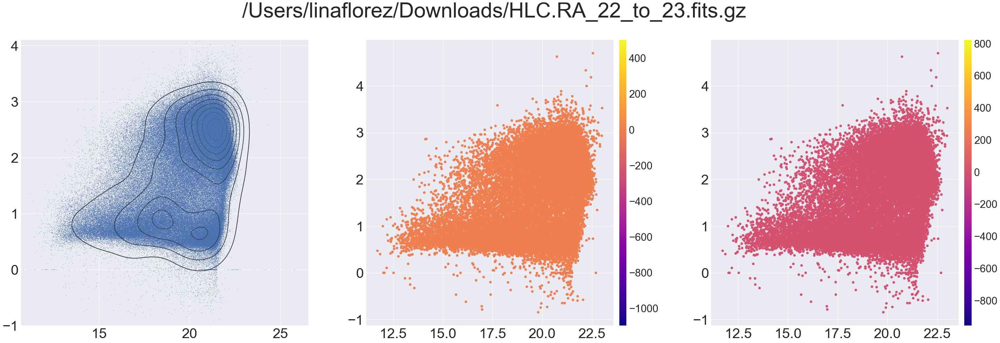

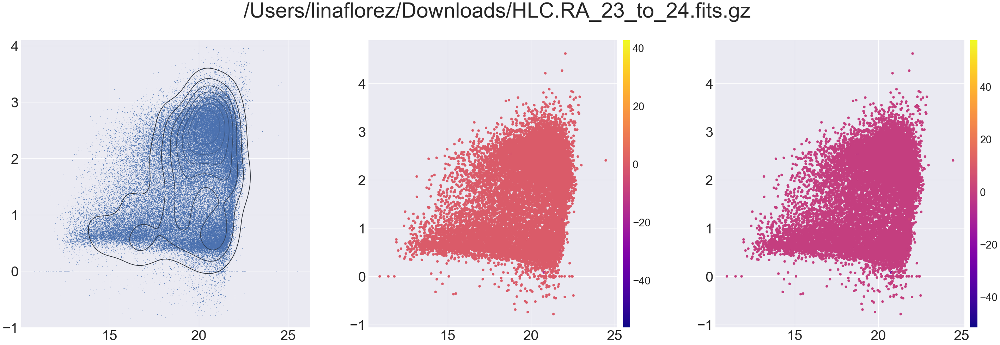

In [435]:
for i in list_HLC:
    hdulist = fits.open(i)
    hdu = hdulist[1].data
    stars = hdu[hdu["MEAN_OBJECT_TYPE"] > 5]
    stars = stars[stars["MEAN_PSFMAG"][:,2] >= 1]
    stars = stars[np.abs(stars["MEAN_PSFMAG"][:,1] - stars["MEAN_PSFMAG"][:,3]) < 10]

    r_stars = stars['MEAN_PSFMAG'][:,2]
    g_stars = stars['MEAN_PSFMAG'][:,1] 
    i_stars = stars['MEAN_PSFMAG'][:,3]

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(50,15))
    fig.suptitle(str(i), size = 60)
    ax1.scatter(r_stars, (g_stars - i_stars), s = 1)
    sns.kdeplot(r_stars[::1000],(g_stars - i_stars)[::1000], ax = ax1)
    ax1.set_ylim(-1,4.1)
    ax1.tick_params("both", labelsize = 40)

    cmap = plt.cm.plasma
    ra_stars = stars['RA_PM']
    ra_minima = np.min(ra_stars)
    ra_maxima = np.max(ra_stars)
    ra_norm = matplotlib.colors.Normalize(vmin=ra_minima, vmax=ra_maxima)
    ax2.scatter(r_stars[::10], (g_stars - i_stars)[::10], color=cmap(ra_norm(ra_stars[::10])))
    sm2 = plt.cm.ScalarMappable(cmap=cmap, norm=ra_norm)
    sm2.set_array([])  # only needed for matplotlib < 3.1
    ax2.tick_params("both", labelsize = 40)
    cbar2 = fig.colorbar(sm2, aspect=40, fraction=.12,pad=.02, ax = ax2)
    cbar2.ax.tick_params(labelsize=30) 


    dec_stars = stars['DEC_PM']
    dec_minima = np.min(dec_stars)
    dec_maxima = np.max(dec_stars)
    dec_norm = matplotlib.colors.Normalize(vmin=dec_minima, vmax=dec_maxima)
    ax3.scatter(r_stars[::10], (g_stars - i_stars)[::10], color=cmap(dec_norm(dec_stars[::10])))
    sm3 = plt.cm.ScalarMappable(cmap=cmap, norm=dec_norm)
    sm3.set_array([])  # only needed for matplotlib < 3.1
    ax3.tick_params("both", labelsize = 40)
    cbar3 = fig.colorbar(sm3, aspect=40, fraction=.12,pad=.02, ax = ax3)
    cbar3.ax.tick_params(labelsize=30) 

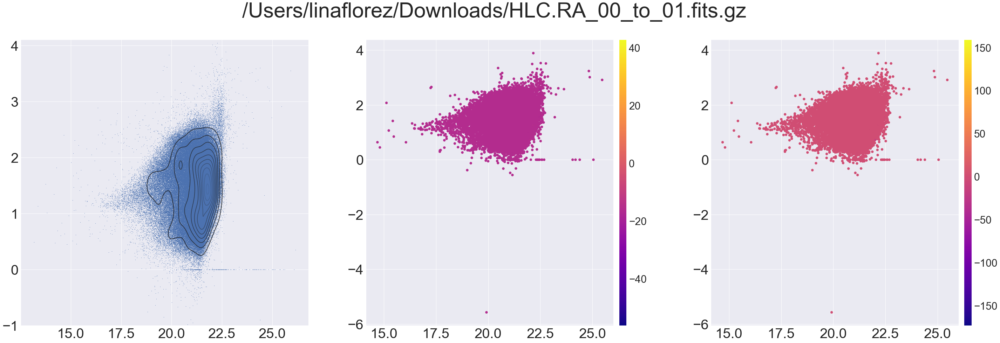

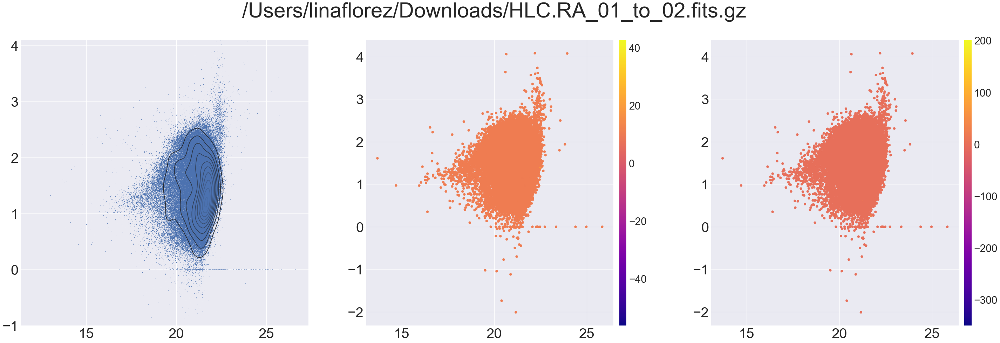

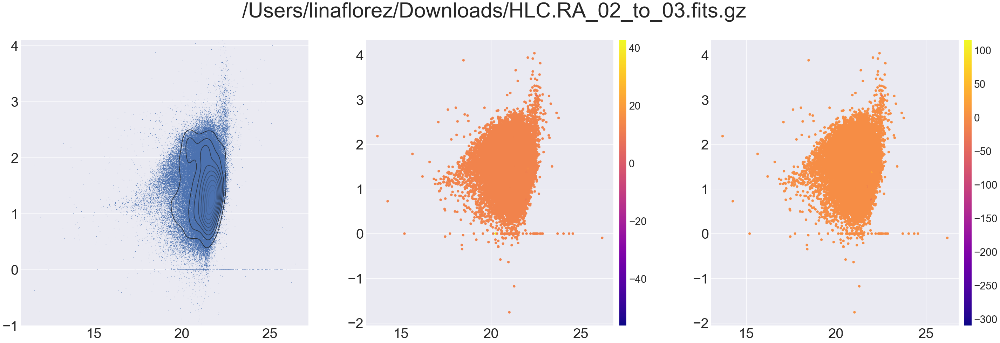

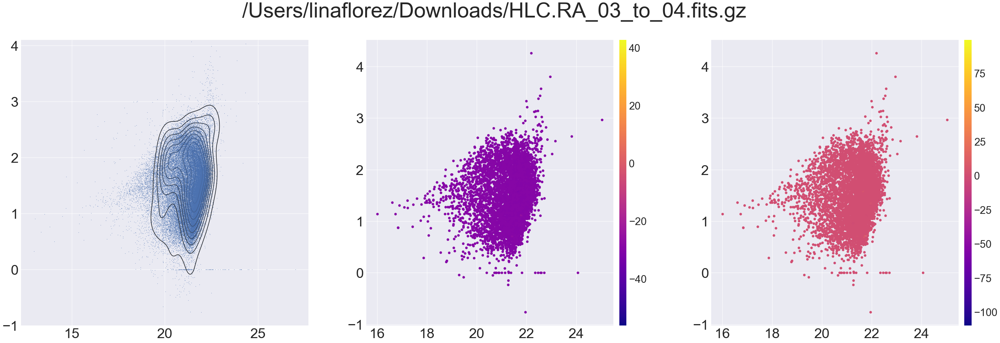

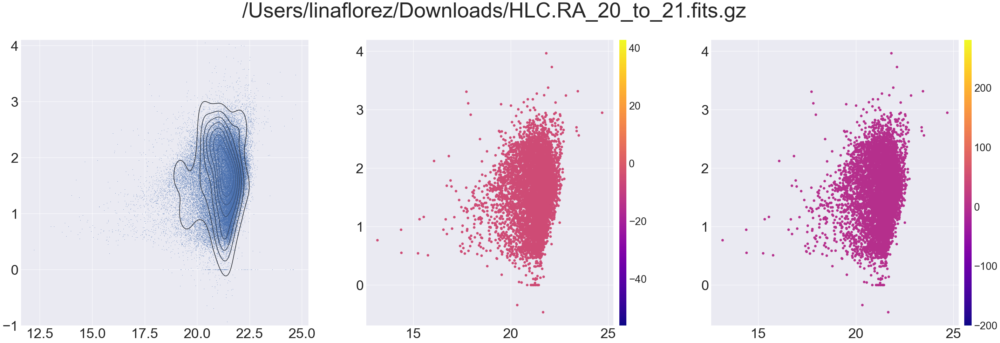

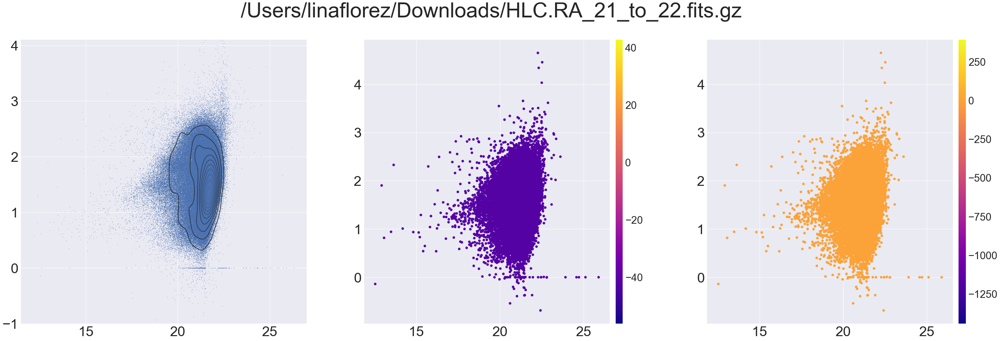

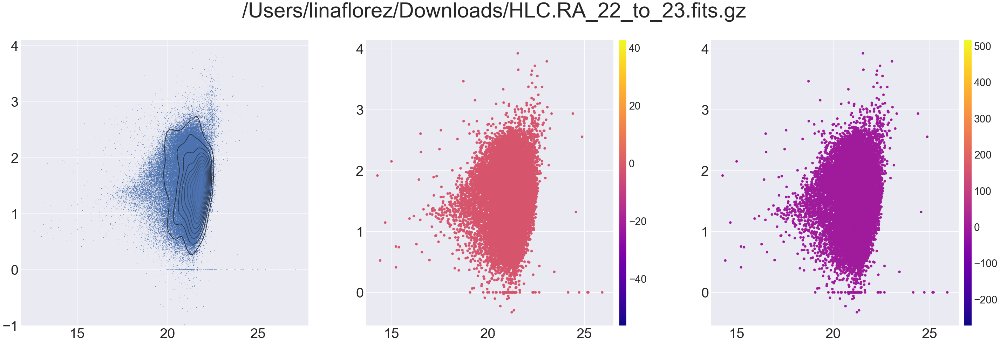

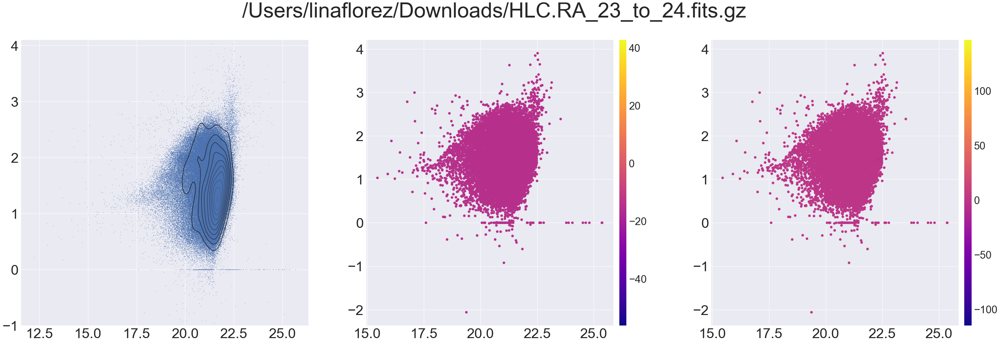

In [436]:
for i in list_HLC:
    hdulist = fits.open(i)
    hdu = hdulist[1].data
    gal = hdu[hdu["MEAN_OBJECT_TYPE"] < 5]
    gal = gal[gal["MEAN_PSFMAG"][:,2] >= 1]
    gal = gal[np.abs(gal["MEAN_PSFMAG"][:,1] - gal["MEAN_PSFMAG"][:,3]) < 10]

    r_gal = gal['MEAN_PSFMAG'][:,2]
    g_gal = gal['MEAN_PSFMAG'][:,1] 
    i_gal = gal['MEAN_PSFMAG'][:,3]

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(50,15))
    fig.suptitle(str(i), size = 60)
    ax1.scatter(r_gal, (g_gal - i_gal), s = 1)
    sns.kdeplot(r_gal[::1000],(g_gal - i_gal)[::1000], ax = ax1)
    ax1.set_ylim(-1,4.1)
    ax1.tick_params("both", labelsize = 40)

    cmap = plt.cm.plasma
    ra_gal = gal['RA_PM']
    ra_minima_g = np.min(ra_gal)
    ra_maxima_g = np.max(ra_gal)
    ra_norm_g = matplotlib.colors.Normalize(vmin = ra_minima_g, vmax = ra_maxima_g)
    ax2.scatter(r_gal[::10], (g_gal - i_gal)[::10], color=cmap(ra_norm_g(ra_gal[::10])))
    sm2_g = plt.cm.ScalarMappable(cmap=cmap, norm=ra_norm)
    sm2_g.set_array([])  # only needed for matplotlib < 3.1
    ax2.tick_params("both", labelsize = 40)
    cbar2 = fig.colorbar(sm2_g, aspect=40, fraction=.12,pad=.02, ax = ax2)
    cbar2.ax.tick_params(labelsize=30) 


    dec_gal = gal['DEC_PM']
    dec_minima_g = np.min(dec_gal)
    dec_maxima_g = np.max(dec_gal)
    dec_norm_g = matplotlib.colors.Normalize(vmin = dec_minima_g, vmax=dec_maxima_g)
    ax3.scatter(r_gal[::10], (g_gal - i_gal)[::10], color=cmap(dec_norm_g(dec_gal[::10])))
    sm3_g = plt.cm.ScalarMappable(cmap=cmap, norm=dec_norm_g)
    sm3_g.set_array([])  # only needed for matplotlib < 3.1
    ax3.tick_params("both", labelsize = 40)
    cbar3 = fig.colorbar(sm3_g, aspect=40, fraction=.12,pad=.02, ax = ax3)
    cbar3.ax.tick_params(labelsize=30) 

#### Comment on the structure in stars vs galaxies, and the evolution with position on the sky in each HLC.


For the star structure, we see that there are two distinct cluster of points, and we see those two distinct distributions in the proper motion of ra and dec. Contrastingly, the galaxy plots show only one cluster, and there's only one distribution in the proper motion of ra and dec.

# Problem 2

### Comparing distributions to a standard normal distribution

Load the `IntroStat_demo.csv` file in the data directory (use `pandas` or `astropy` or whatever you like).

In [56]:
data = pd.read_csv("/Users/linaflorez/Desktop/ast596_2020_Spring/data/01/IntroStat_demo.csv")

Estimate the sample mean and variance of the suspiciously named `mag.outlier` column.

Make a Q-Q plot of the `mag.outlier` column and over plot a line with Y = Mean + Sigma*X on it.

Calculate the values of the first and third quartiles, and use some linear algebra to figure out the equation of a line passing through them (google line 2 point form if you need a refresher on the linear algebra)

Overplot that line passing through the data.

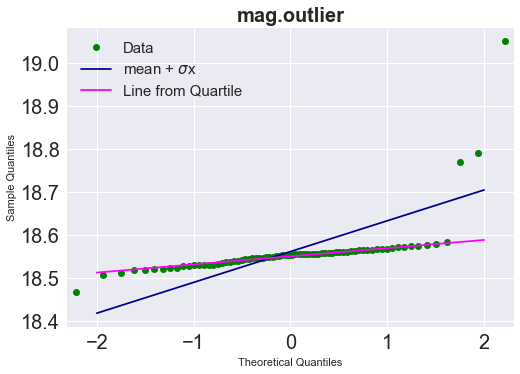

In [317]:
x = np.linspace(-2,2, 1000)

## Estimate the sample mean and variance
outlier_mean, outlier_variance = data["mag.outlier"].mean(), data["mag.outlier"].std()

## Make a Q-Q plot of the `mag.outlier` column 
fig = plt.figure()
ax = fig.add_subplot()
sm.qqplot(data["mag.outlier"], color = "green", ax = ax, label = "Data")


## Overplot Y = Mean + Sigma*X on it.
def y_line(x, mean_val, var_value):
    ans = mean_val + (var_value * x)
    return ans

y_val1 = y_line(x, outlier_mean, outlier_variance)
ax.plot(x, y_val1, color = "darkblue", label = "mean + ${\sigma}$x")


## Overplot line that passes thru data
first_y1, first_x1 = np.percentile(data["mag.outlier"],25), -0.674
third_y1, third_x1 = np.percentile(data["mag.outlier"],75), 0.674 

## Overplot line that passes thru data
def line(x1,y1,x2,y2, x):
    slope = (y2 - y1)/(x2 - x1)
    b = (-slope * x1) + y1
    line = (slope * x) + b
    return line

ax.plot(x, line(first_x1,first_y1,third_x1, third_y1, x), color = "magenta", label = "Line from Quartile")

plt.title("mag.outlier", weight = "bold", size = 20)
plt.tick_params("both", labelsize = 20)
plt.legend(loc = "best", prop = {"size":15})

Now try the same thing with `mag.het`. 

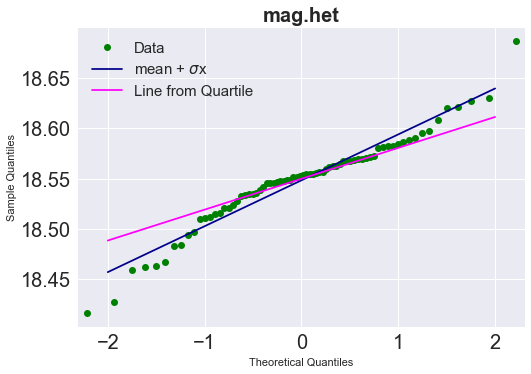

In [318]:
## Estimate the sample mean and variance
het_mean, het_variance = data["mag.het"].mean(), data["mag.het"].std()

## Make a Q-Q plot of the `mag.outlier` column 
fig = plt.figure()
ax = fig.add_subplot()
sm.qqplot(data["mag.het"], color = "green", ax = ax, label = "Data")

## Overplot Y = Mean + Sigma*X on it.
y_val = y_line(x, het_mean, het_variance)
ax.plot(x, y_val, color = "darkblue", label = "mean + ${\sigma}$x")


## Overplot line that passes thru data
first_y2, first_x2 = np.percentile(data["mag.het"],25), -0.674
third_y2, third_x2 = np.percentile(data["mag.het"],75), 0.674 
ax.plot(x, line(first_x2,first_y2,third_x2, third_y2, x), color = "magenta", label = "Line from Quartile")

plt.title("mag.het", weight = "bold", size = 20)
plt.tick_params("both", labelsize = 20)
plt.legend(loc = "best", prop = {"size":15})


#### Describe what you found?

I notice that for mag.het, the mean + ${\sigma}$x line as well as the quartile line somewhat fit the majority data. The edge points we see vary considerably from the main body of the points. We are plotting magnitude v SNR, so with all of this we can interpret that for smaller magnitude sources (which are brighter), the signal to noise is large, and vice versa.

What happens if you rescale the data? Subtract of the sample mean of `mag.het` and divide by `mag.het.error`. Now repeat the Q-Q plot with this quantity. 

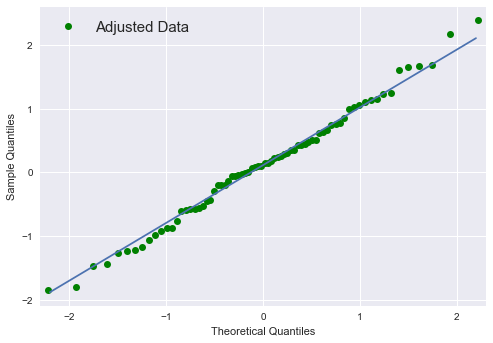

In [360]:
fig = plt.figure()
ax = fig.add_subplot()
changing = (data["mag.het"] - het_mean)/ data["mag.het.error"]
x_ = np.linspace(-2.2, 2.2, 1000)
sm.qqplot(changing, color = "green", ax = ax, label = "Adjusted Data")
y_val3 = y_line(x_, np.mean(changing.values), np.std(changing.values))
ax.plot(x_,y_val3)
ax.legend(loc = "best", prop = {"size":15})


#### Describe what's going on.

If I'm understanding this correctingly, in following the procedure to rescale the data we effectively reduced the error. We can see this especially in the edge points, which don't vary 

# Problem 3

The demo data set for this part is the Wesenheit index of the OGLE-III fundamental-mode and first overtone classical Cepheids. 

These stars are awesome because you can use them to measure distances. Here's a nice [youtube video](https://www.youtube.com/watch?v=iyisAjHdhas) on these stars.

You'll try to estimate their period-luminosity relationship. 

The Wesenheit index is defined as `W = I - 1.55(V - I)`, and its main advantage over using simply the I or V photometry is that it is insensitive to extinction. It is denoted by 'W' among the data columns. 

Other columns are 'name', the identifier of the star; 'RA0' (in decimal hours) and 'Decl0' (in decimal degrees), celestial coordinates; 'Mode', the mode of the Cepheid ('F' indicates fundamental-mode, '1' indicates first overtone star); 'Cloud', indicating which Magellanic Cloud the star belongs to; 'logP1', the base-10 logarithm of the period in days; 'VI', the colour V-I.

In [98]:
cepheids = pd.read_csv("/Users/linaflorez/Desktop/ast596_2020_Spring/data/01/Cepheids.csv")
LMC = cepheids[cepheids["Cloud"] == "LMC"]
SMC = cepheids[cepheids["Cloud"] == "SMC"]
F_LMC = LMC[LMC["Mode"] == "F"]
I_LMC = LMC[LMC["Mode"] == "1"]
F_SMC = SMC[SMC["Mode"] == "F"]
I_SMC = SMC[SMC["Mode"] == "1"]
LMC.columns

Index(['name', 'RA0', 'Decl0', 'Mode', 'Cloud', 'W', 'logP1', 'VI'], dtype='object')

### Split the data into LMC and SMC, and then again by mode F and 1, and plot the `W` on the y-axis vs `log(P1)` on x. Fit or estimate straight lines to each of the four samples (you can use `statsmodels` `astropy` `scipy` `numpy`....)(Yes, we've not covered fitting straight lines. That's OK.)

### Compute the residuals of each sample to it's respective line. Do these residuals look like a normal distribution? If not, speculate on why (WATCH THE YOUTUBE VIDEO!)

### Plot the residuals color coded by if they are positive or negative vs RA and Dec (just like a Hess diagram in Problem 1).

### Finally, plot the residuals against the fitted `W` values, and just to anticipate the next homework assignment, also plot `log(P1) vs V-I`. Comment on what you are seeing.

/anaconda3/envs/fds/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0, 0.5, 'V-I')

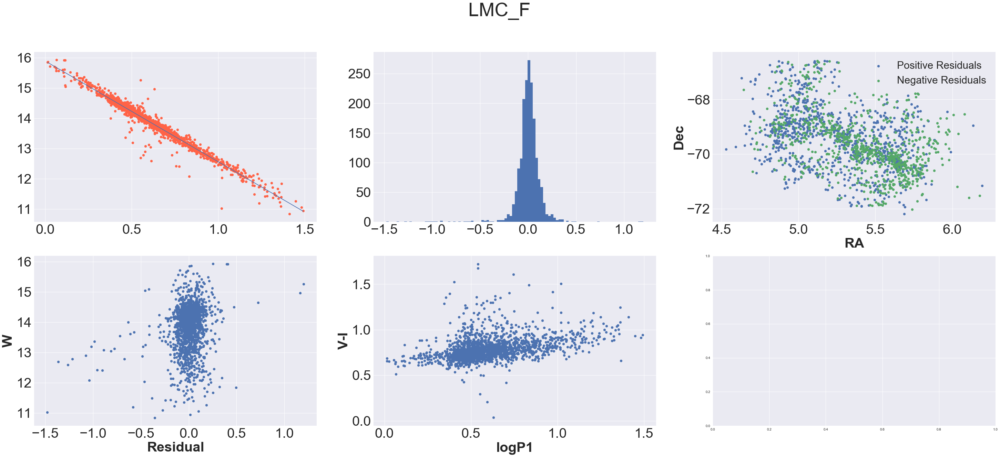

In [439]:
plt.style.use("seaborn")
fig, ((ax1, ax2, ax3),(ax4,ax5, ax6)) = plt.subplots(2, 3, figsize=(50,20))
fig.suptitle('LMC_F', size = 55)

W_F_LMC, logp_F_LMC = F_LMC["W"], F_LMC["logP1"]
ax1.scatter(logp_F_LMC,W_F_LMC,color = "tomato")
a1, b1 = np.polyfit(logp_F_LMC,W_F_LMC,1)
x1 = np.linspace(np.min(logp_F_LMC), np.max(logp_F_LMC), 100)
y1 = x1*a1 + b1
ax1.plot(x1, y1, label = "Fit Line")
ax1.tick_params("both", labelsize = 40)

y1_1 = W_F_LMC - (logp_F_LMC*a1 + b1)
ax2.hist(y1_1, bins = 100)[2]
ax2.tick_params("both", labelsize = 20)
ax2.tick_params("both", labelsize = 40)


F_LMC["residual"] = y1_1
ra1_pos = F_LMC["RA0"][F_LMC["residual"] > 0]
ra1_neg = F_LMC["RA0"][F_LMC["residual"] < 0]
dec1_pos = F_LMC['Decl0'][F_LMC["residual"] > 0]
dec1_neg = F_LMC['Decl0'][F_LMC["residual"] < 0]


ax3.scatter(ra1_pos, dec1_pos, label = "Positive Residuals")
ax3.scatter(ra1_neg, dec1_neg, label = "Negative Residuals")
ax3.set_xlabel("RA", weight = "bold", size = 40)
ax3.set_ylabel("Dec", weight = "bold", size = 40)
ax3.tick_params("both", labelsize = 40)
ax3.legend(loc = "best", prop = {"size":30})


ax4.scatter(F_LMC["residual"],F_LMC["W"])
ax4.tick_params("both", labelsize = 40)
ax4.set_xlabel("Residual", weight = "bold", size = 40)
ax4.set_ylabel("W", weight = "bold", size = 40)



ax5.scatter(F_LMC["logP1"],F_LMC["VI"])
ax5.tick_params("both", labelsize = 40)
ax5.set_xlabel("logP1", weight = "bold", size = 40)
ax5.set_ylabel("V-I", weight = "bold", size = 40)

/anaconda3/envs/fds/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0, 0.5, 'V-I')

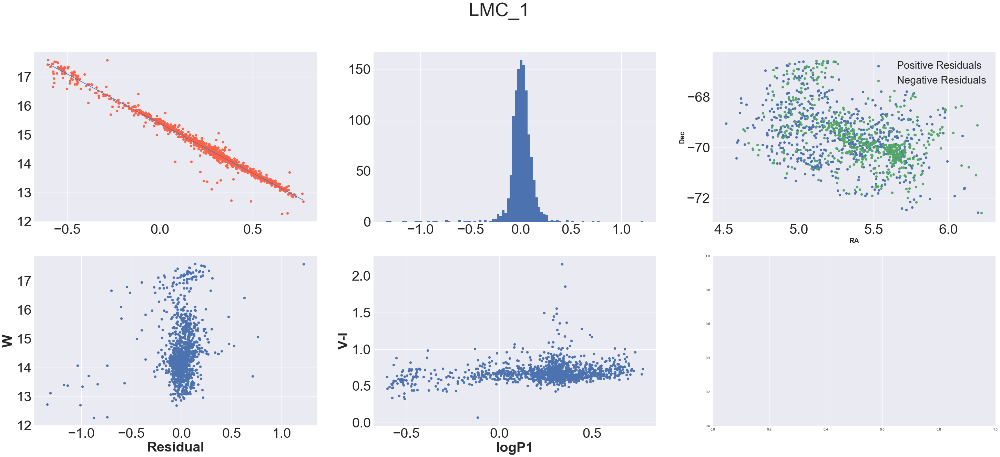

In [438]:
plt.style.use("seaborn")
fig, ((ax1, ax2, ax3),(ax4,ax5, ax6)) = plt.subplots(2, 3, figsize=(50,20))
fig.suptitle('LMC_1', size = 55)

W_I_LMC, logp_I_LMC = I_LMC["W"], I_LMC["logP1"]
ax1.scatter(logp_I_LMC,W_I_LMC,color = "tomato")

a2, b2 = np.polyfit(logp_I_LMC,W_I_LMC,1)
x2 = np.linspace(np.min(logp_I_LMC), np.max(logp_I_LMC), 100)
y2 = x2*a2 + b2
ax1.plot(x2, y2, label = "Fit LinE")
ax1.tick_params("both", labelsize = 40)

y2_1 = W_I_LMC - (logp_I_LMC*a2 + b2)
ax2.hist(y2_1, bins = 100)[2]
ax2.tick_params("both", labelsize = 40)


I_LMC["residual"] = y2_1
ra2_pos = I_LMC["RA0"][I_LMC["residual"] > 0]
ra2_neg = I_LMC["RA0"][I_LMC["residual"] < 0]
dec2_pos = I_LMC['Decl0'][I_LMC["residual"] > 0]
dec2_neg = I_LMC['Decl0'][I_LMC["residual"] < 0]


ax3.scatter(ra2_pos, dec2_pos, label = "Positive Residuals")
ax3.scatter(ra2_neg, dec2_neg, label = "Negative Residuals")
ax3.set_xlabel("RA", weight = "bold", size = 20)
ax3.set_ylabel("Dec", weight = "bold", size = 20)
ax3.tick_params("both", labelsize = 40)
ax3.legend(loc = "best", prop = {"size":30})
ax3.legend(loc = "best", prop = {"size":30})


ax4.scatter(I_LMC["residual"],I_LMC["W"])
ax4.tick_params("both", labelsize = 40)
ax4.set_xlabel("Residual", weight = "bold", size = 40)
ax4.set_ylabel("W", weight = "bold", size = 40)


ax5.scatter(I_LMC["logP1"],I_LMC["VI"])
ax5.tick_params("both", labelsize = 40)
ax5.set_xlabel("logP1", weight = "bold", size = 40)
ax5.set_ylabel("V-I", weight = "bold", size = 40)

/anaconda3/envs/fds/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0, 0.5, 'V-I')

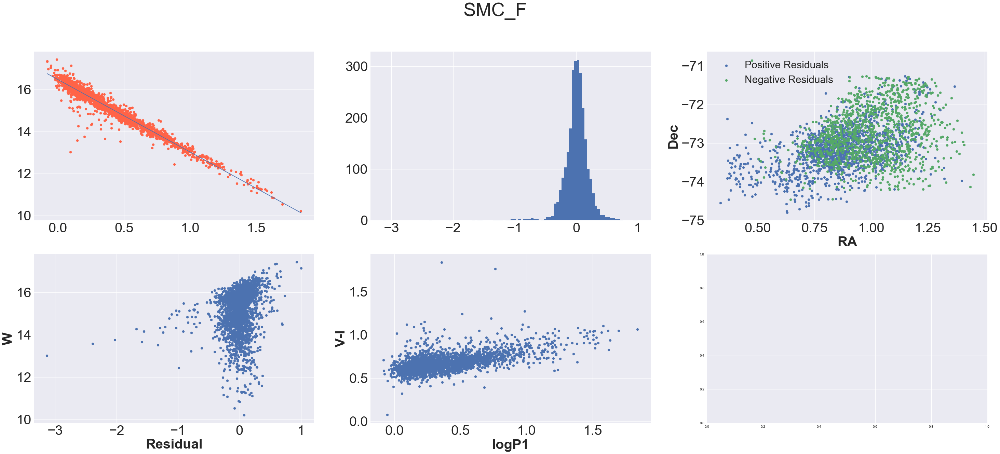

In [428]:
plt.style.use("seaborn")
fig, ((ax1, ax2, ax3),(ax4,ax5, ax6)) = plt.subplots(2, 3, figsize=(50,20))
fig.suptitle('SMC_F', size = 55)

W_F_SMC, logp_F_SMC = F_SMC["W"], F_SMC["logP1"]
ax1.scatter(logp_F_SMC,W_F_SMC,color = "tomato")

a3, b3 = np.polyfit(logp_F_SMC,W_F_SMC,1)
x3 = np.linspace(np.min(logp_F_SMC), np.max(logp_F_SMC), 100)
y3 = x3*a3 + b3
ax1.plot(x3, y3, label = "Fit Line")
ax1.tick_params("both", labelsize = 40)

y3_1 = W_F_SMC - (logp_F_SMC*a3 + b3)
ax2.hist(y3_1, bins = 100)[2]
ax2.tick_params("both", labelsize = 40)

F_SMC["residual"] = y3_1
ra3_pos = F_SMC["RA0"][F_SMC["residual"] > 0]
ra3_neg = F_SMC["RA0"][F_SMC["residual"] < 0]
dec3_pos = F_SMC['Decl0'][F_SMC["residual"] > 0]
dec3_neg = F_SMC['Decl0'][F_SMC["residual"] < 0]


ax3.scatter(ra3_pos, dec3_pos, label = "Positive Residuals")
ax3.scatter(ra3_neg, dec3_neg, label = "Negative Residuals")
ax3.set_xlabel("RA", weight = "bold", size = 40)
ax3.set_ylabel("Dec", weight = "bold", size = 40)
ax3.legend(loc = "best", prop = {"size":30})
ax3.tick_params("both", labelsize = 40)


ax4.scatter(F_SMC["residual"],F_SMC["W"])
ax4.tick_params("both", labelsize = 40)
ax4.set_xlabel("Residual", weight = "bold", size = 40)
ax4.set_ylabel("W", weight = "bold", size = 40)


ax5.scatter(F_SMC["logP1"],F_SMC["VI"])
ax5.tick_params("both", labelsize = 40)
ax5.set_xlabel("logP1", weight = "bold", size = 40)
ax5.set_ylabel("V-I", weight = "bold", size = 40)

/anaconda3/envs/fds/lib/python3.7/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0, 0.5, 'V-I')

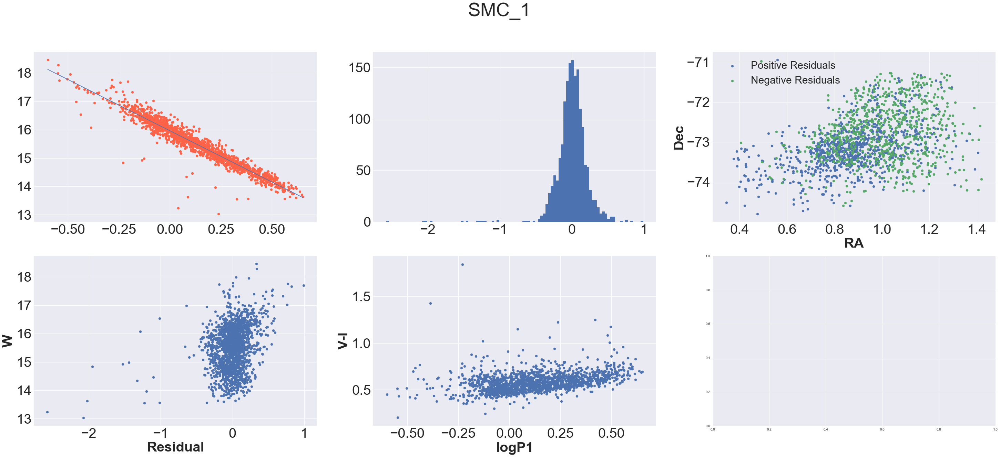

In [429]:
plt.style.use("seaborn")
fig, ((ax1, ax2, ax3),(ax4,ax5, ax6)) = plt.subplots(2, 3, figsize=(50,20))
fig.suptitle('SMC_1', size = 55)

W_I_SMC, logp_I_SMC = I_SMC["W"], I_SMC["logP1"]
ax1.scatter(logp_I_SMC,W_I_SMC,color = "tomato")
a4, b4 = np.polyfit(logp_I_SMC,W_I_SMC,1)
x4 = np.linspace(np.min(logp_I_SMC), np.max(logp_I_SMC), 100)
y4 = x4*a4 + b4
ax1.plot(x4, y4, label = "Fit Line")
ax1.tick_params("both", labelsize = 40)

y4_1 = W_I_SMC - (logp_I_SMC*a4 + b4)
ax2.hist(y4_1, bins = 100)[2]
ax2.tick_params("both", labelsize = 40)

I_SMC["residual"] = y4_1
ra4_pos = I_SMC["RA0"][I_SMC["residual"] > 0]
ra4_neg = I_SMC["RA0"][I_SMC["residual"] < 0]
dec4_pos = I_SMC['Decl0'][I_SMC["residual"] > 0]
dec4_neg = I_SMC['Decl0'][I_SMC["residual"] < 0]


ax3.scatter(ra4_pos, dec4_pos, label = "Positive Residuals")
ax3.scatter(ra4_neg, dec4_neg, label = "Negative Residuals")
ax3.set_xlabel("RA", weight = "bold", size = 40)
ax3.set_ylabel("Dec", weight = "bold", size = 40)
ax3.legend(loc = "best", prop = {"size":30})
ax3.tick_params("both", labelsize = 40)

ax4.scatter(I_SMC["residual"],I_SMC["W"])
ax4.tick_params("both", labelsize = 40)
ax4.set_xlabel("Residual", weight = "bold", size = 40)
ax4.set_ylabel("W", weight = "bold", size = 40)


ax5.scatter(I_SMC["logP1"],I_SMC["VI"])
ax5.tick_params("both", labelsize = 40)
ax5.set_xlabel("logP1", weight = "bold", size = 40)
ax5.set_ylabel("V-I", weight = "bold", size = 40)

### Comments
Looking at the LMC, the residuals and proper motion seem to independent of one another. In contrast, for the SMC, we see that there's a bias occurring between the residuals and the proper motion. In regards to the normal distribution, the histogram of the residuals seem too peaked/too tall to be a gaussian/be normally distributed.